# Cell cycle in the soybean leaf single-cell data

Questions this notebook answers, in order:

1. Which cell cycle genes are most cluster-specific, and where on the UMAP do they sit?
2. Is any cluster *driven* by cell cycle expression (a total cell cycle score per cell)?
3. If we regress cell cycle out and recluster, does the integration get better — i.e. do
   the replicate batches mix more while the biology (treatment, cell type) is preserved?

Data: the collaborator's `adata_rna.h5ad` (30,467 cells x 36,042 genes, 13 libraries), loaded through
`pipeline.build` so the raw CellBender counts become `.X` and `rep_block` is attached.
Gene list: `Soybean_cell_cycle_genes.csv` (129 Glyma IDs, no phase labels — so this is a
single "cell cycle" score rather than separate S / G2M scores).

The baseline processing mirrors `scripts/02_build_and_integrate.py`'s `harmony_repblock`
variant (the defensible one: batch key crossed with treatment), so the comparison in part 3
is "that pipeline, with vs without cell cycle regression".

In [1]:
import sys, warnings
from pathlib import Path
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import sparse
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import adjusted_rand_score, silhouette_score

warnings.filterwarnings("ignore")
sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=90, facecolor="white", frameon=False)
sc.settings.n_jobs = 8

ANALYSIS_ROOT = Path.cwd() if (Path.cwd() / "pipeline").exists() else Path.cwd() / "Claude_analysis"
sys.path.insert(0, str(ANALYSIS_ROOT))
from pipeline import config as cfg, build

CC_CSV = Path("C:/Users/mikep/Data/Soybean/Soybean_reference_info/Soybean_cell_cycle_genes.csv")
OUT = cfg.RESULTS_ROOT / "cell_cycle"          # large outputs, gitignored
SUMMARY = cfg.SUMMARY_ROOT / "cell_cycle"      # small tables, tracked
OUT.mkdir(parents=True, exist_ok=True); SUMMARY.mkdir(parents=True, exist_ok=True)
SEED, N_PCS, RES = 0, 30, 0.8
print(cfg.COLLAB_H5AD)

C:\Users\mikep\git\Soybean_Single_Cell_drought_heat\Data\anndata_export\adata_rna.h5ad


## 1. Load and baseline processing

In [2]:
adata = build.load_collab_h5ad()
# Drop the suffix so gene IDs match the reference lists
adata.var["full_id"] = adata.var_names
adata.var_names = adata.var_names.str.replace(r"\.Wm82\.a4\.v1$", "", regex=True)
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 30467 × 36042
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'pctCP', 'pctMT', 'nUMI_raw', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'seurat_clusters', 'treatment', 'libraries', 'replicate', 'source_rds', 'integrated_snn_res.0.5', 'celltype_call', 'cluster_annot', 'rep_block', 'pct_chloroplast', 'source'
    var: 'highly_variable', 'in_integrated', 'full_id'
    uns: 'pca', 'pca_loadings', 'source', 'counts_are_cellbender_corrected'
    obsm: 'X_pca_theirs', 'X_umap_theirs'
    layers: 'counts', None (.X)

In [3]:
# Normalise from counts exactly as the pipeline does
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.layers["lognorm"] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="libraries", layer="lognorm")
print(adata.var["highly_variable"].sum(), "HVGs")

2000 HVGs


In [4]:
def embed_and_cluster(adata, hvg_mask, tag, regress_key=None, n_pcs=N_PCS, resolution=RES, seed=SEED):
    """lognorm HVGs -> (optional regress_out) -> scale -> PCA -> Harmony(rep_block) -> leiden -> UMAP.
    Results land in obsm[f'X_pca_{tag}'], obsm[f'X_harmony_{tag}'], obsm[f'X_umap_{tag}'], obs[f'leiden_{tag}']."""
    import harmonypy
    sub = adata[:, hvg_mask].copy()
    sub.X = sub.layers["lognorm"].copy()
    if regress_key is not None:
        sub.X = sub.X.toarray() if sparse.issparse(sub.X) else sub.X
        sc.pp.regress_out(sub, keys=regress_key, n_jobs=8)
    sc.pp.scale(sub, max_value=10)
    sc.tl.pca(sub, n_comps=n_pcs, svd_solver="arpack", random_state=seed)
    adata.obsm[f"X_pca_{tag}"] = sub.obsm["X_pca"]
    adata.uns[f"pca_{tag}_variance_ratio"] = sub.uns["pca"]["variance_ratio"]
    ho = harmonypy.run_harmony(sub.obsm["X_pca"], adata.obs, vars_use=["rep_block"], max_iter_harmony=20, verbose=False)
    Z = np.asarray(ho.Z_corr)
    adata.obsm[f"X_harmony_{tag}"] = Z if Z.shape[0] == adata.n_obs else Z.T
    sc.pp.neighbors(adata, use_rep=f"X_harmony_{tag}", key_added=tag, random_state=seed)
    sc.tl.leiden(adata, resolution=resolution, key_added=f"leiden_{tag}", neighbors_key=tag,
                 flavor="igraph", n_iterations=2, random_state=seed)
    sc.tl.umap(adata, neighbors_key=tag, random_state=seed)
    adata.obsm[f"X_umap_{tag}"] = adata.obsm.pop("X_umap")
    print(f"[{tag}] {adata.obs[f'leiden_{tag}'].nunique()} leiden clusters")

def umap(adata, tag, **kw):
    """sc.pl.umap on a named embedding without clobbering X_umap."""
    adata.obsm["X_umap"] = adata.obsm[f"X_umap_{tag}"]
    out = sc.pl.umap(adata, **kw)
    del adata.obsm["X_umap"]
    return out

embed_and_cluster(adata, adata.var["highly_variable"].to_numpy(), "base")

2026-08-20 14:13:17,023 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


2026-08-20 14:13:23,782 - harmonypy - INFO - sklearn.KMeans initialization complete.


[base] 20 leiden clusters


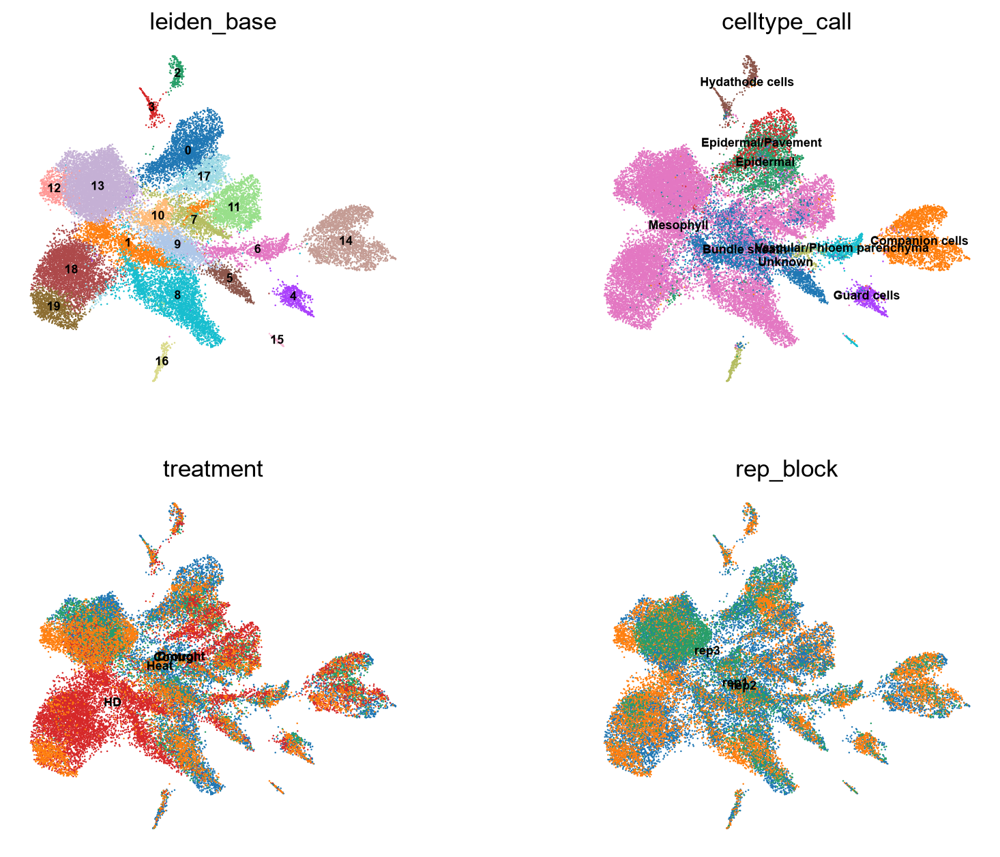

In [5]:
umap(adata, "base", color=["leiden_base", "celltype_call", "treatment", "rep_block"],
     ncols=2, legend_loc="on data", legend_fontsize=7, wspace=0.3)

## 2. Cell cycle genes: which are present, and which are cluster-specific

"Cluster specific" here = Wilcoxon one-vs-rest on the log-normalised values, per leiden
cluster, restricted to the cell cycle genes. Each gene gets the best score it achieves in any
cluster; the top 25 by that score are the genes whose expression is most concentrated in a
single cluster. The table also reports the log fold change and the fraction of cells in /
outside that cluster expressing the gene, so a gene that is "specific" only because it is
barely expressed anywhere is easy to spot.

In [6]:
cc = pd.read_csv(CC_CSV)["Gene ID"].astype(str).str.strip()
cc_genes = [g for g in cc if g in adata.var_names]
missing = sorted(set(cc) - set(cc_genes))
print(f"{len(cc)} genes in list, {len(cc_genes)} present in the data, {len(missing)} missing: {missing[:10]}")
adata.var["cell_cycle"] = adata.var_names.isin(cc_genes)
print(f"{adata.var.loc[cc_genes, 'highly_variable'].sum()} of them are HVGs")
expr_frac = pd.Series(np.asarray((adata[:, cc_genes].layers["lognorm"] > 0).mean(axis=0)).ravel(), index=cc_genes)
print(f"median fraction of cells expressing a cell-cycle gene: {expr_frac.median():.3f}")

129 genes in list, 93 present in the data, 36 missing: ['Glyma.01G100000', 'Glyma.01G189700', 'Glyma.01G193400', 'Glyma.02G277600', 'Glyma.03G033900', 'Glyma.03G069200', 'Glyma.03G123600', 'Glyma.03G123800', 'Glyma.03G124200', 'Glyma.04G001100']
1 of them are HVGs
median fraction of cells expressing a cell-cycle gene: 0.005


In [7]:
cc_ad = adata[:, cc_genes].copy()
cc_ad.X = cc_ad.layers["lognorm"]
sc.tl.rank_genes_groups(cc_ad, groupby="leiden_base", method="wilcoxon", pts=True, use_raw=False)
rk = sc.get.rank_genes_groups_df(cc_ad, group=None)
rk = rk.rename(columns={"names": "gene", "group": "cluster", "scores": "wilcoxon_score",
                        "logfoldchanges": "log2FC", "pct_nz_group": "pct_in", "pct_nz_reference": "pct_out"})
best = rk.sort_values("wilcoxon_score", ascending=False).drop_duplicates("gene").reset_index(drop=True)
best["n_cells_in_cluster"] = best["cluster"].map(adata.obs["leiden_base"].value_counts())
top25 = best.head(25).copy()
top25.to_csv(SUMMARY / "top25_cluster_specific_cell_cycle_genes.csv", index=False)
best.to_csv(SUMMARY / "all_cell_cycle_genes_best_cluster.csv", index=False)
top25.style.format({"wilcoxon_score": "{:.1f}", "log2FC": "{:.2f}", "pct_in": "{:.2f}", "pct_out": "{:.3f}", "pvals_adj": "{:.1e}"})

,cluster,gene,wilcoxon_score,log2FC,pvals,pvals_adj,pct_in,pct_out,n_cells_in_cluster
0,14,Glyma.10G249800,23.0,1.60,0.000000,1.4e-115,0.57,0.291,2465
1,14,Glyma.20G143800,17.0,1.34,0.000000,4.0e-63,0.44,0.224,2465
2,10,Glyma.08G291000,14.7,2.80,0.000000,9.6e-47,0.40,0.103,767
3,17,Glyma.05G243000,12.7,3.12,0.000000,5.7e-35,0.27,0.045,1054
4,6,Glyma.18G133100,5.7,3.16,0.000000,1.1e-06,0.12,0.017,1023
5,14,Glyma.07G223700,4.5,0.72,0.000005,1.3e-04,0.14,0.085,2465
6,0,Glyma.02G030200,3.7,1.79,0.000185,1.7e-02,0.07,0.023,2435
7,17,Glyma.18G008700,3.7,0.80,0.000228,1.0e-02,0.15,0.075,1054
8,14,Glyma.10G158100,3.7,0.68,0.000237,4.4e-03,0.12,0.070,2465
9,17,Glyma.14G039900,3.5,0.58,0.000415,1.0e-02,0.19,0.118,1054


In [8]:
# Which clusters do the top-25 specific genes point to?
top25["cluster"].value_counts().rename("n of top-25 genes").to_frame().T

cluster,17,14,13,6,0,10,16
n of top-25 genes,10,6,3,2,2,1,1


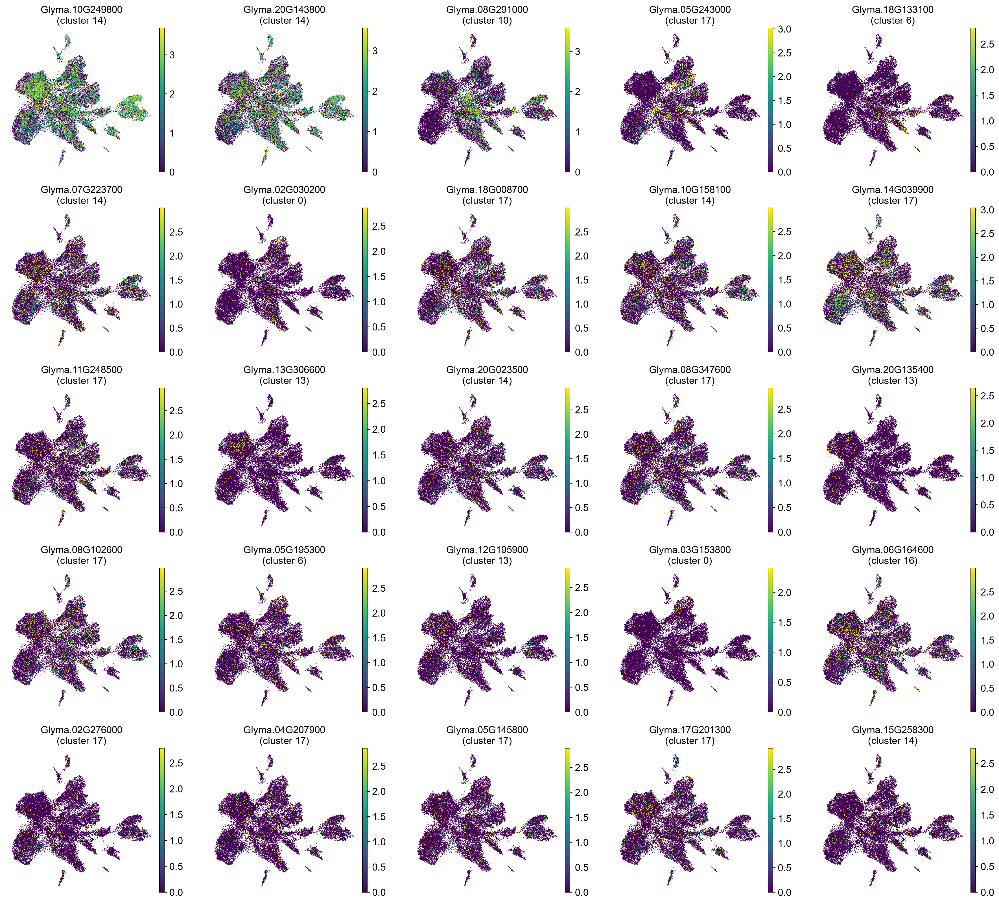

In [9]:
adata.obsm["X_umap"] = adata.obsm["X_umap_base"]
sc.pl.umap(adata, color=top25["gene"].tolist(), layer="lognorm", ncols=5, cmap="viridis",
           vmax="p99.5", size=4, title=[f"{g}\n(cluster {c})" for g, c in zip(top25["gene"], top25["cluster"])])
del adata.obsm["X_umap"]

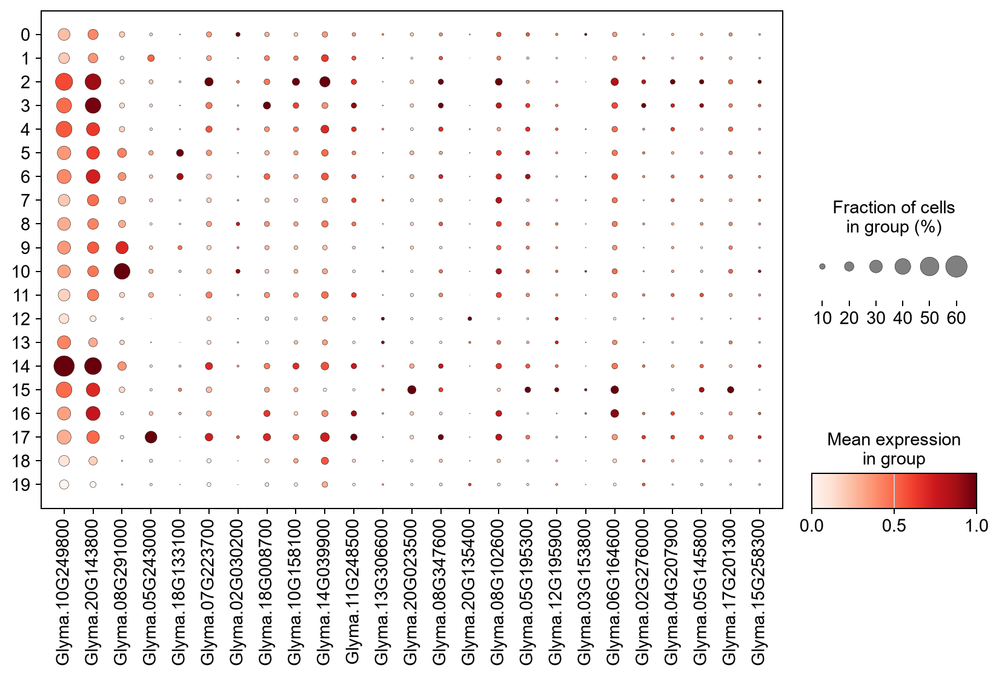

In [10]:
# Dotplot of the same 25 genes across clusters - easier to read the specificity than 25 UMAPs
sc.pl.dotplot(adata, var_names=top25["gene"].tolist(), groupby="leiden_base", layer="lognorm",
              standard_scale="var", dendrogram=False, figsize=(11, 6))

## 3. A total cell cycle score per cell

`sc.tl.score_genes`: mean log-expression of the cell cycle genes minus the mean of a
random, expression-matched control set. Positive = more cell cycle expression than
background. A cluster is "cell-cycle driven" if its cells sit high on this score **and** cell
cycle genes dominate its marker list.

In [11]:
sc.tl.score_genes(adata, gene_list=cc_genes, score_name="cc_score", ctrl_size=50, n_bins=25, random_state=SEED, use_raw=False)
# also a plain count-based readout that does not depend on the control-set trick
adata.obs["cc_frac_umi"] = np.asarray(adata[:, cc_genes].layers["counts"].sum(axis=1)).ravel() / adata.obs["nCount_RNA"].to_numpy()
adata.obs["cc_n_genes"] = np.asarray((adata[:, cc_genes].layers["counts"] > 0).sum(axis=1)).ravel()
adata.obs[["cc_score", "cc_frac_umi", "cc_n_genes"]].describe().T

,count,mean,std,min,25%,50%,75%,max
cc_score,30467.0,-0.002017,0.040219,-0.118224,-0.031885,-0.006207,0.023264,0.192185
cc_frac_umi,30467.0,0.002459,0.001956,0.000000,0.001159,0.002035,0.003538,0.017094
cc_n_genes,30467.0,2.123051,1.765402,0.000000,1.000000,2.000000,3.000000,14.000000


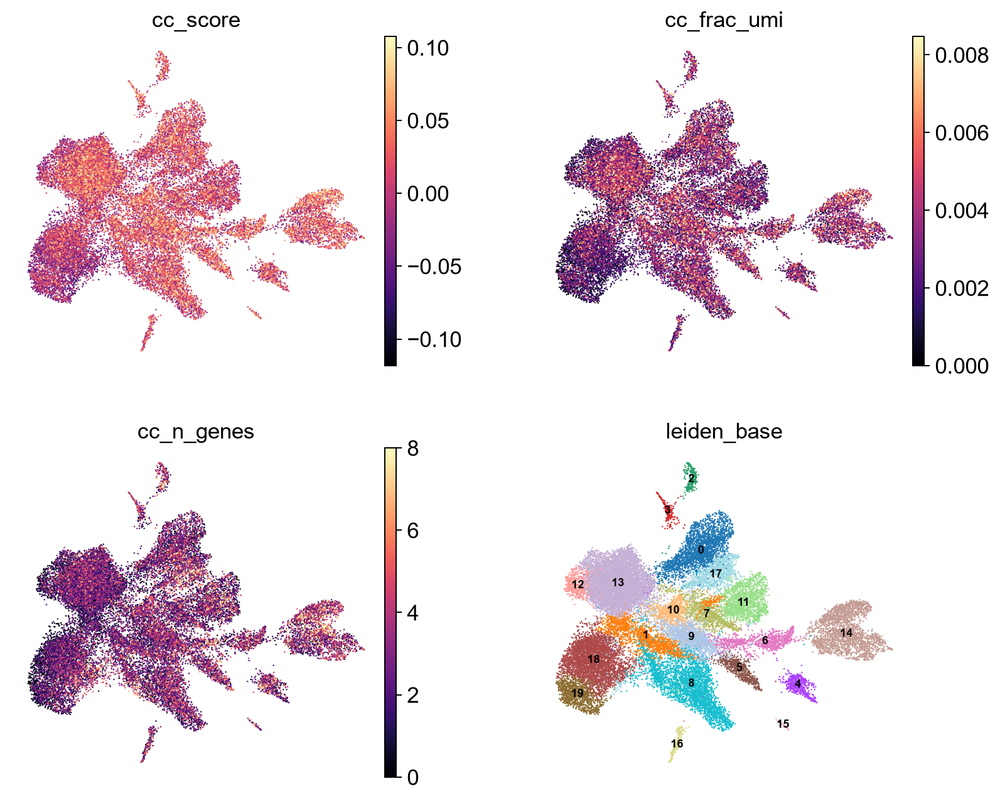

In [12]:
umap(adata, "base", color=["cc_score", "cc_frac_umi", "cc_n_genes", "leiden_base"],
     ncols=2, cmap="magma", vmax="p99", legend_loc="on data", legend_fontsize=7, wspace=0.3)

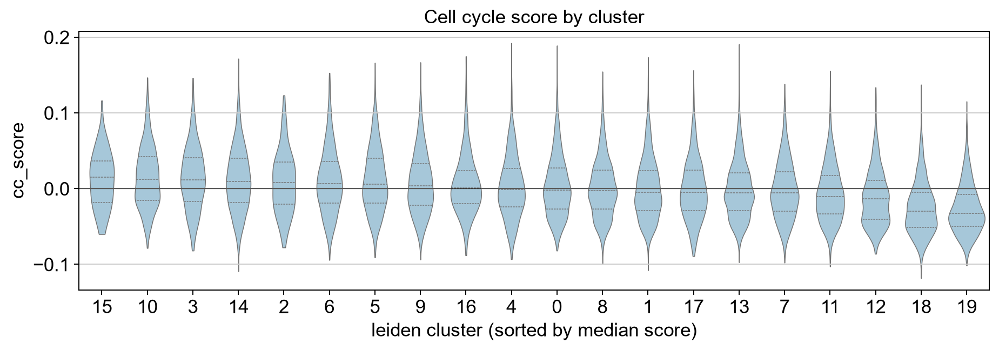

In [13]:
order = adata.obs.groupby("leiden_base", observed=True)["cc_score"].median().sort_values(ascending=False).index
fig, ax = plt.subplots(figsize=(12, 3.5))
sns.violinplot(data=adata.obs, x="leiden_base", y="cc_score", order=order, inner="quartile", cut=0, linewidth=0.6, ax=ax, color="#9ecae1")
ax.axhline(0, color="k", lw=0.5); ax.set_xlabel("leiden cluster (sorted by median score)"); ax.set_title("Cell cycle score by cluster")
plt.show()

In [14]:
hi = adata.obs["cc_score"].quantile(0.95)
per_cluster = (adata.obs.groupby("leiden_base", observed=True)
               .agg(n_cells=("cc_score", "size"), median_cc_score=("cc_score", "median"), mean_cc_score=("cc_score", "mean"),
                    frac_cells_top5pct=("cc_score", lambda s: (s > hi).mean()),
                    median_cc_frac_umi=("cc_frac_umi", "median"),
                    dominant_celltype=("celltype_call", lambda s: s.value_counts().index[0]),
                    dominant_celltype_frac=("celltype_call", lambda s: s.value_counts(normalize=True).iloc[0])))
# how many of the cluster's top-50 markers (all genes) are cell cycle genes?
sc.tl.rank_genes_groups(adata, groupby="leiden_base", method="wilcoxon", layer="lognorm", use_raw=False, n_genes=50, key_added="rk_all")
mk = sc.get.rank_genes_groups_df(adata, group=None, key="rk_all")
per_cluster["cc_genes_in_top50_markers"] = mk.groupby("group")["names"].apply(lambda g: g.isin(cc_genes).sum())
per_cluster["cc_genes_in_top50_markers"] = per_cluster["cc_genes_in_top50_markers"].fillna(0).astype(int)
per_cluster = per_cluster.sort_values("median_cc_score", ascending=False)
per_cluster.to_csv(SUMMARY / "cell_cycle_score_by_cluster.csv")
per_cluster.style.format({"median_cc_score": "{:.3f}", "mean_cc_score": "{:.3f}", "frac_cells_top5pct": "{:.2f}",
                          "median_cc_frac_umi": "{:.4f}", "dominant_celltype_frac": "{:.2f}"}).background_gradient(subset=["median_cc_score", "frac_cells_top5pct", "cc_genes_in_top50_markers"], cmap="Reds")

,n_cells,median_cc_score,mean_cc_score,frac_cells_top5pct,median_cc_frac_umi,dominant_celltype,dominant_celltype_frac,cc_genes_in_top50_markers
leiden_base,,,,,,,,
15,58,0.015,0.012,0.03,0.0027,Vascular/Phloem parenchyma,0.79,0
10,767,0.012,0.015,0.09,0.0031,Bundle sheath,0.61,1
3,203,0.012,0.014,0.08,0.0030,Hydathode cells,0.83,0
14,2465,0.010,0.012,0.09,0.0030,Companion cells,0.97,0
2,253,0.008,0.008,0.08,0.0027,Hydathode cells,0.94,0
6,1023,0.006,0.010,0.09,0.0028,Vascular/Phloem parenchyma,0.56,0
5,622,0.006,0.011,0.09,0.0027,Bundle sheath,0.95,0
9,1666,0.003,0.007,0.08,0.0026,Bundle sheath,0.65,1
16,192,0.001,0.006,0.06,0.0022,Unknown,0.85,0


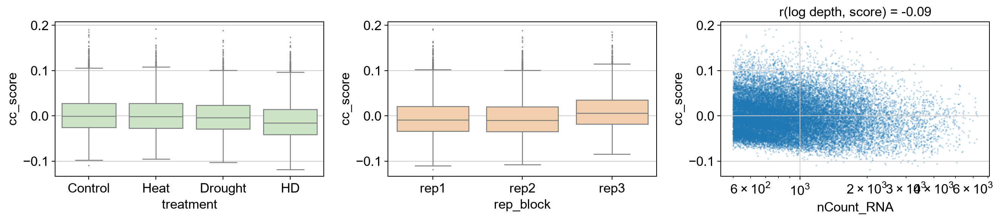

treatment
Control   -0.000847
Heat      -0.001819
Drought   -0.004135
HD        -0.015721
Name: cc_score, dtype: float64


In [15]:
# Does the score track anything other than cluster? Check treatment, replicate and library depth.
fig, axes = plt.subplots(1, 3, figsize=(15, 3.5))
sns.boxplot(data=adata.obs, x="treatment", y="cc_score", ax=axes[0], fliersize=0.5, color="#c7e9c0")
sns.boxplot(data=adata.obs, x="rep_block", y="cc_score", ax=axes[1], fliersize=0.5, color="#fdd0a2")
axes[2].scatter(adata.obs["nCount_RNA"], adata.obs["cc_score"], s=1, alpha=0.2); axes[2].set_xscale("log")
axes[2].set_xlabel("nCount_RNA"); axes[2].set_ylabel("cc_score")
r = np.corrcoef(np.log10(adata.obs["nCount_RNA"]), adata.obs["cc_score"])[0, 1]
axes[2].set_title(f"r(log depth, score) = {r:.2f}")
plt.tight_layout(); plt.show()
print(adata.obs.groupby(["treatment"], observed=True)["cc_score"].median())

In [16]:
# How much of the baseline embedding is explained by the cell cycle score?
def pc_r2(adata, rep, score="cc_score", n=10):
    X = adata.obsm[rep][:, :n]; s = adata.obs[score].to_numpy()
    return pd.Series([np.corrcoef(X[:, i], s)[0, 1] ** 2 for i in range(n)], index=[f"PC{i+1}" for i in range(n)])
r2_base = pc_r2(adata, "X_pca_base")
print("R^2 of cc_score with each baseline PC:"); print(r2_base.round(3).to_string())

R^2 of cc_score with each baseline PC:
PC1     0.018
PC2     0.017
PC3     0.009
PC4     0.040
PC5     0.005
PC6     0.001
PC7     0.015
PC8     0.000
PC9     0.001
PC10    0.000


## 4. Correct for cell cycle and recluster

Two corrections, each fed through the identical downstream (scale → PCA → Harmony on
`rep_block` → leiden → UMAP) so only the correction differs:

- **`regress`** — `sc.pp.regress_out(cc_score)` on the log-normalised HVGs. The standard
  Seurat/scanpy approach; removes the component of every gene that is linear in the score.
- **`drop`** — simply exclude cell cycle genes from the HVG set. Milder; leaves co-regulated
  non-list genes in place.

Integration is judged with the same diagnostics as `pipeline.integration`: the mean fraction
of each cell's 30 nearest neighbours (in the Harmony space) that share its label. For
`rep_block` and `libraries` lower = better mixing; for `treatment` and `celltype_call` higher =
biology preserved. The null (random mixing) value for each label is shown alongside, since a
label with 3 levels can never get below ~0.33. ARI against the collaborator's
`cluster_annot` asks whether the de-novo clusters still recover their annotation.

In [17]:
embed_and_cluster(adata, adata.var["highly_variable"].to_numpy(), "regress", regress_key=["cc_score"])
hvg_drop = (adata.var["highly_variable"] & ~adata.var["cell_cycle"]).to_numpy()
print(hvg_drop.sum(), "HVGs after dropping cell cycle genes")
embed_and_cluster(adata, hvg_drop, "drop")

2026-08-20 14:16:12,801 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


2026-08-20 14:16:16,777 - harmonypy - INFO - sklearn.KMeans initialization complete.


[regress] 16 leiden clusters
1999 HVGs after dropping cell cycle genes


2026-08-20 14:17:42,804 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


2026-08-20 14:17:46,907 - harmonypy - INFO - sklearn.KMeans initialization complete.


[drop] 18 leiden clusters


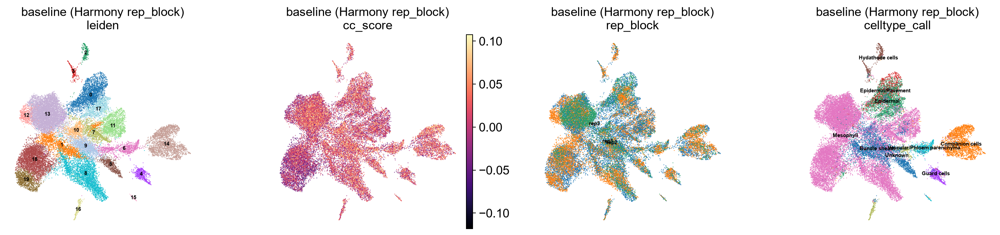

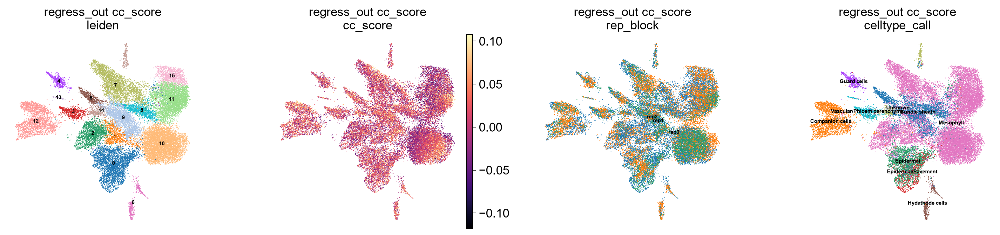

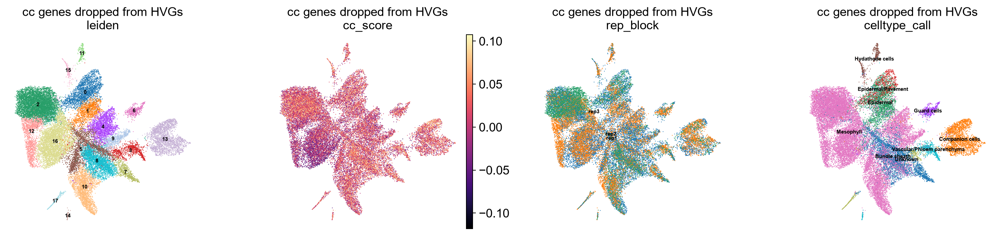

In [18]:
TAGS = {"base": "baseline (Harmony rep_block)", "regress": "regress_out cc_score", "drop": "cc genes dropped from HVGs"}
for tag, title in TAGS.items():
    umap(adata, tag, color=[f"leiden_{tag}", "cc_score", "rep_block", "celltype_call"], ncols=4,
         cmap="magma", vmax="p99", legend_loc="on data", legend_fontsize=6, size=3, wspace=0.25,
         title=[f"{title}\nleiden", f"{title}\ncc_score", f"{title}\nrep_block", f"{title}\ncelltype_call"])

In [19]:
def knn_purity(rep, labels, k=30):
    nn = NearestNeighbors(n_neighbors=k + 1, n_jobs=8).fit(rep)
    _, idx = nn.kneighbors(rep)
    return float((labels[idx[:, 1:]] == labels[:, None]).mean())

def null_purity(labels):
    p = pd.Series(labels).value_counts(normalize=True).to_numpy()
    return float((p ** 2).sum())

rng = np.random.default_rng(SEED)
sil_idx = rng.choice(adata.n_obs, 8000, replace=False)
rows = []
for tag, title in TAGS.items():
    rep = adata.obsm[f"X_harmony_{tag}"]
    row = {"variant": tag, "description": title, "n_clusters": adata.obs[f"leiden_{tag}"].nunique()}
    for key in ["rep_block", "libraries", "treatment", "celltype_call"]:
        row[f"purity_{key}"] = knn_purity(rep, adata.obs[key].astype(str).to_numpy())
    row["sil_rep_block"] = silhouette_score(rep[sil_idx], adata.obs["rep_block"].astype(str).to_numpy()[sil_idx])
    row["sil_celltype"] = silhouette_score(rep[sil_idx], adata.obs["celltype_call"].astype(str).to_numpy()[sil_idx])
    row["ARI_vs_cluster_annot"] = adjusted_rand_score(adata.obs["cluster_annot"], adata.obs[f"leiden_{tag}"])
    row["ARI_vs_celltype_call"] = adjusted_rand_score(adata.obs["celltype_call"], adata.obs[f"leiden_{tag}"])
    row["ARI_vs_baseline_leiden"] = adjusted_rand_score(adata.obs["leiden_base"], adata.obs[f"leiden_{tag}"])
    row["max_PC_R2_cc_score"] = pc_r2(adata, f"X_pca_{tag}").max()
    # how strongly does cc_score segregate by cluster? (eta^2 = between-cluster / total variance)
    g = adata.obs.groupby(f"leiden_{tag}", observed=True)["cc_score"]
    row["cc_score_eta2_by_cluster"] = float((g.size() * (g.mean() - adata.obs["cc_score"].mean()) ** 2).sum() / ((adata.obs["cc_score"] - adata.obs["cc_score"].mean()) ** 2).sum())
    rows.append(row)
metrics = pd.DataFrame(rows).set_index("variant")
null = {f"purity_{k}": null_purity(adata.obs[k].astype(str).to_numpy()) for k in ["rep_block", "libraries", "treatment", "celltype_call"]}
metrics.loc["random_null"] = pd.Series(null)
metrics.to_csv(SUMMARY / "integration_metrics_cell_cycle_correction.csv")
metrics.style.format("{:.3f}", subset=metrics.columns.drop(["description", "n_clusters"])).background_gradient(subset=["purity_rep_block", "purity_libraries"], cmap="RdYlGn_r").background_gradient(subset=["purity_treatment", "purity_celltype_call", "ARI_vs_cluster_annot", "ARI_vs_celltype_call"], cmap="RdYlGn")

,description,n_clusters,purity_rep_block,purity_libraries,purity_treatment,purity_celltype_call,sil_rep_block,sil_celltype,ARI_vs_cluster_annot,ARI_vs_celltype_call,ARI_vs_baseline_leiden,max_PC_R2_cc_score,cc_score_eta2_by_cluster
variant,,,,,,,,,,,,,
base,baseline (Harmony rep_block),20.000000,0.575,0.412,0.622,0.864,-0.048,0.137,0.405,0.196,1.000,0.040,0.084
regress,regress_out cc_score,16.000000,0.563,0.400,0.614,0.862,-0.047,0.130,0.430,0.223,0.718,0.000,0.041
drop,cc genes dropped from HVGs,18.000000,0.572,0.412,0.635,0.869,-0.043,0.133,0.428,0.202,0.728,0.039,0.086
random_null,nan,nan,0.382,0.104,0.271,0.412,nan,nan,nan,nan,nan,nan,nan


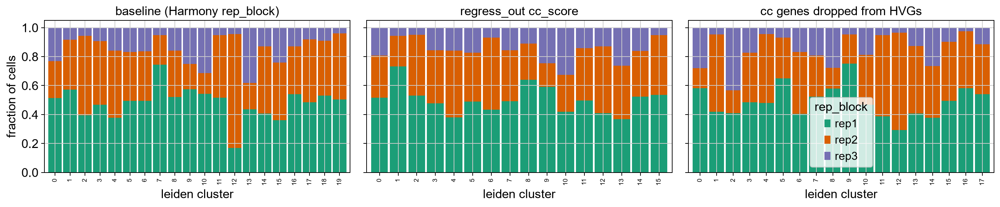

base    :  0 of 20 clusters are >80% one rep_block
regress :  0 of 16 clusters are >80% one rep_block
drop    :  0 of 18 clusters are >80% one rep_block


In [20]:
# Per-cluster replicate composition: a well-integrated cluster has all three blocks in it
fig, axes = plt.subplots(1, 3, figsize=(16, 3.5), sharey=True)
for ax, (tag, title) in zip(axes, TAGS.items()):
    ct = pd.crosstab(adata.obs[f"leiden_{tag}"], adata.obs["rep_block"], normalize="index")
    ct.plot.bar(stacked=True, ax=ax, width=0.9, legend=(ax is axes[-1]), color=["#1b9e77", "#d95f02", "#7570b3"])
    ax.set_title(title); ax.set_xlabel("leiden cluster"); ax.tick_params(axis="x", labelsize=7)
axes[0].set_ylabel("fraction of cells")
plt.tight_layout(); plt.show()

# and the fraction of clusters that are >80% one replicate block (i.e. batch-driven clusters)
for tag in TAGS:
    ct = pd.crosstab(adata.obs[f"leiden_{tag}"], adata.obs["rep_block"], normalize="index")
    print(f"{tag:8s}: {(ct.max(axis=1) > 0.8).sum():2d} of {len(ct)} clusters are >80% one rep_block")

In [21]:
# Where did the cells from the high-cell-cycle clusters go after correction?
top_cc_clusters = per_cluster.index[:2].tolist()
for tag in ["regress", "drop"]:
    print(f"\n--- {tag}: fate of baseline clusters {top_cc_clusters} ---")
    sub = adata.obs[adata.obs["leiden_base"].isin(top_cc_clusters)]
    print(pd.crosstab(sub["leiden_base"], sub[f"leiden_{tag}"]).loc[top_cc_clusters].pipe(lambda d: d.loc[:, d.sum() > 0]))


--- regress: fate of baseline clusters ['15', '10'] ---
leiden_regress  0   1  2  3  7  8    9  10  11  12  13  15
leiden_base                                               
15              0   1  0  0  0  0    0   1   2   1  53   0
10              4  12  1  1  2  4  698  34   5   1   3   2

--- drop: fate of baseline clusters ['15', '10'] ---
leiden_drop  0   2  4  5    8  9  10  12  13  14  16
leiden_base                                         
15           0   0  0  0    0  0   0   1   2  53   2
10           1  16  2  9  733  3   1   1   1   0   0


## 5. Save

In [22]:
adata.obs.to_csv(OUT / "obs_with_cell_cycle.csv")
adata.write_h5ad(OUT / "adata_cell_cycle.h5ad", compression="gzip")
print("written to", OUT)

written to C:\Users\mikep\git\Soybean_Single_Cell_drought_heat\Claude_analysis\results\cell_cycle


## 6. Summary

**Cell cycle is essentially absent from this dataset, and no cluster is driven by it.**

*Gene list coverage.* 93 of the 129 genes are present in the object (the other 36 were dropped by
the collaborator's gene filter, i.e. never detected). Only **1** of the 93 is a highly variable gene.
The median cell cycle gene is detected in **0.5 %** of cells; the median cell has 2 of the 93 genes
detected and 0.25 % of its UMIs on them.

*Cluster-specific genes (part 2).* Only four genes carry a real cluster signal
(`Glyma.10G249800`, `Glyma.20G143800` in cluster 14 = companion cells; `Glyma.08G291000` in cluster 10 =
bundle sheath; `Glyma.05G243000` in cluster 17 = epidermis). Below those the Wilcoxon scores fall to
< 6 and by gene 13 the adjusted p-values are no longer significant — the bottom half of the "top 25"
is noise, which the UMAPs show: sparse scattered dots, no concentrated patch. The 25 UMAPs do not
reveal any proliferating (e.g. meristematic or dividing) cluster; the few specific genes look like
cell-type markers that happen to sit on the cell cycle list rather than a cycling programme.

*Total cell cycle score (part 3).* The score spans −0.12 to 0.19 and its between-cluster variance
(η² = 0.08) is small. The highest-scoring clusters (15, 10, 3, 14: phloem parenchyma, bundle sheath,
hydathode, companion cells) have median scores of 0.010–0.015 and at most 1 cell cycle gene among
their 50 top markers. The lowest-scoring clusters are all mesophyll — the gradient is mostly mesophyll
(photosynthetic, chloroplast-heavy) vs vascular, not cycling vs non-cycling. The score also declines
Control → Heat → Drought → HD, and explains at most **4 %** of any of the first 10 PCs.

*Cell cycle correction (part 4).* Regressing out the score, or dropping the genes from the HVGs, and
rerunning the identical Harmony(`rep_block`) pipeline:

| | base | regress | drop | random null |
|---|---|---|---|---|
| rep_block kNN purity (lower = better mixing) | 0.575 | 0.563 | 0.572 | 0.382 |
| libraries kNN purity (lower = better) | 0.412 | 0.400 | 0.412 | 0.104 |
| treatment kNN purity (higher = biology kept) | 0.622 | 0.614 | 0.635 | 0.271 |
| celltype_call kNN purity (higher = biology kept) | 0.864 | 0.862 | 0.869 | 0.412 |
| ARI vs collaborator `cluster_annot` | 0.405 | 0.430 | 0.428 | |
| max PC R² with cc_score | 0.040 | 0.000 | 0.039 | |

Regression does what it says (the score's R² with every PC goes to 0) but the integration metrics move
by ~0.01 — within the noise of a re-run — and treatment / cell-type preservation moves by the same
amount in the same direction, so nothing was gained. No cluster in any variant is >80 % one replicate
block. The high-score clusters survive correction intact (cluster 15 → one cluster, cluster 10 → one
cluster, in both variants), confirming they are cell types, not cell cycle states.

**Recommendation:** do not add a cell cycle regression step to the pipeline. The replicate-batch effect
that dominates this data (see the README: 72 % of PC1) is not cell cycle, and the mature-leaf tissue
simply has no detectable proliferating population.

*Environment note:* the `Single_cell` and `Seacells` conda envs crash on any LAPACK call (numpy from
the defaults channel built against `mkl-sdl`, sitting on conda-forge MKL 2025.3 → delay-load DLL error
0xC06D007F). This notebook was run in a new env, `soy_cc` (conda-forge, OpenBLAS, scanpy 1.12.3,
harmonypy 0.0.10).